In [1]:
import numpy as np
import pandas as pd 

from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasClassifier

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc

import tensorflow as tf
import seaborn as sns
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.model_selection import StratifiedKFold
from tensorflow.keras.utils import to_categorical
from keras import regularizers

In [2]:
#fixed random seed for reproducibility 
np.random.seed(0)

In [3]:
# load dataset (input variables = X, output variables = Y)
df = pd.read_csv("2.csv")

#count the number of occurances for each osID
OsID_counts = df['OsID'].value_counts()

#filter for osIDs that have 10 or more occurances
OsID_counts_filtered = OsID_counts[OsID_counts >= 10]

#assign a label for each osID 
OsID_labels = {}
class_no = 0
for osID in OsID_counts_filtered.index:
    OsID_labels[osID] = class_no
    class_no +=1

#filter the dataset with osID that contain 10 or more occurances
dataGene = df[df['OsID'].isin(OsID_counts_filtered.index)]

dataGene = dataGene.drop(['Class', 'Trait'],axis=1)

# Add a new column 'class' to the filtered dataset
dataGene['class'] = dataGene['OsID'].map(OsID_labels)

#print("Summary of dataGene:\n",dataGene.describe())

In [4]:
X = dataGene.drop(['class','OsID'], axis=1) # exclude class & OsID column
Y = dataGene['class']

#input feature names in order of descending importance scores in MI feature selection method
feature_names = ['Root10DaysSeedling', 'Shoot10DaysSeedling', 'Root35DaysSeedling', 'Leaf45DaysOldPlant', 'Shoot35DaysSeedling',
                 'Root14DaysSeedling', 'Root24DaysSeedling', 'Root17DaysSeedling', 'Root21DaysSeedling', 'Shoot3DaysSeedling',
                 'Shoot21DaysSeedling', 'PCC', 'Shoot14DaysSeedling', 'Root52DaysSeedling', 'Shoot17DaysSeedling', 
                 'Leaf21DaysSeedling', 'log_2FoldChange', 'ET', 'PPI', 'CoExpression']

X_fs = X.reindex(columns=feature_names)

print("Shape of X:\n",X_fs.shape)
print("Shape of Y:\n",Y.shape)

# Statistical summary of the variables
#print("Summary of X:\n",X.describe())
#print("Summary of Y:\n",Y.describe())

# Check for class imbalance
print(df.groupby(Y).size())

# change both input and target variables datatype to ndarray

X_fs = X_fs.values # 2-D array

# select target variable 

Y = Y.values #1-D array
Y = Y.reshape(-1, 1)


Shape of X:
 (41110, 20)
Shape of Y:
 (41110,)
class
0.0      1800
1.0      1296
2.0      1260
3.0      1218
4.0      1026
5.0      1008
6.0       930
7.0       912
8.0       880
9.0       798
10.0      792
11.0      759
12.0      729
13.0      720
14.0      702
15.0      693
16.0      672
17.0      640
18.0      625
19.0      570
20.0      546
21.0      506
22.0      483
23.0      448
24.0      432
25.0      384
26.0      360
27.0      360
28.0      320
29.0      312
         ... 
343.0      12
344.0      12
345.0      12
346.0      12
347.0      12
348.0      12
349.0      12
350.0      12
351.0      12
352.0      12
353.0      12
354.0      12
355.0      11
356.0      11
357.0      11
358.0      11
359.0      11
360.0      11
361.0      10
362.0      10
363.0      10
364.0      10
365.0      10
366.0      10
367.0      10
368.0      10
369.0      10
370.0      10
371.0      10
372.0      10
Length: 373, dtype: int64


Class=0, n=1800 (4.378%)
Class=1, n=1296 (3.153%)
Class=2, n=1260 (3.065%)
Class=3, n=1218 (2.963%)
Class=4, n=1026 (2.496%)
Class=5, n=1008 (2.452%)
Class=6, n=930 (2.262%)
Class=7, n=912 (2.218%)
Class=8, n=880 (2.141%)
Class=9, n=798 (1.941%)
Class=10, n=792 (1.927%)
Class=11, n=759 (1.846%)
Class=12, n=729 (1.773%)
Class=13, n=720 (1.751%)
Class=14, n=702 (1.708%)
Class=15, n=693 (1.686%)
Class=16, n=672 (1.635%)
Class=17, n=640 (1.557%)
Class=18, n=625 (1.520%)
Class=19, n=570 (1.387%)
Class=20, n=546 (1.328%)
Class=21, n=506 (1.231%)
Class=22, n=483 (1.175%)
Class=23, n=448 (1.090%)
Class=24, n=432 (1.051%)
Class=25, n=384 (0.934%)
Class=26, n=360 (0.876%)
Class=27, n=360 (0.876%)
Class=28, n=320 (0.778%)
Class=29, n=312 (0.759%)
Class=30, n=312 (0.759%)
Class=31, n=306 (0.744%)
Class=32, n=304 (0.739%)
Class=33, n=299 (0.727%)
Class=34, n=297 (0.722%)
Class=35, n=296 (0.720%)
Class=36, n=280 (0.681%)
Class=37, n=264 (0.642%)
Class=38, n=260 (0.632%)
Class=39, n=253 (0.615%)
Clas

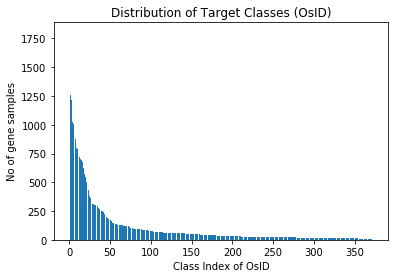

In [5]:
from collections import Counter
# summarize distribution
counter = Counter(Y.flatten())

# sort counter by keys
counter = dict(sorted(counter.items()))

for k,v in counter.items():
 per = v / len(Y.flatten()) * 100
 print('Class=%d, n=%d (%.3f%%)' % (k, v, per))
# plot the distribution
plt.bar( counter.keys(), counter.values())

plt.ylabel('No of gene samples')
plt.xlabel('Class Index of OsID')
plt.title('Distribution of Target Classes (OsID)')
plt.show()

In [6]:
def draw_confusion_matrix(cm):
    plt.figure(figsize=(12,8))
    sns.heatmap(cm,annot=True,fmt="d", center=0, cmap='autumn') 
    plt.title("Confusion Matrix")
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

In [7]:
# prepare target data
def prepare_targets(y_train, y_test):
	le = LabelEncoder()
	
	#fit the encoders only to the training data and then transform both train and test data
	y_train_enc = le.fit_transform(y_train)
	y_test_enc = le.transform(y_test)

	return y_train_enc, y_test_enc

In [8]:
# define baseline model (MLP)
def MLP_model(input_dim):

    model = Sequential()
    model.add(Dense(60, input_dim=input_dim,bias_initializer='normal', activation='relu',kernel_regularizer=regularizers.l2(0.0001)))
    model.add(Dense(20,bias_initializer='normal',activation='relu',kernel_regularizer=regularizers.l2(0.0001)))
    model.add(Dense(20,bias_initializer='normal',activation='relu',kernel_regularizer=regularizers.l2(0.0001)))
    model.add(Dense(373,kernel_initializer='normal', activation='softmax')) #softmax for multi-class classification, num_classes = 373

    # Compile model
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    
    return model

In [9]:
# split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_fs, Y, test_size=0.33, random_state=1)

# prepare output data
y_train_enc, y_test_enc = prepare_targets(y_train, y_test)

# Define the number of folds for k-fold cross-validation
k = 2

# Define the cross-validation method
cv_method = StratifiedKFold(n_splits=k)

# Initialize the list to store the history, train & validation(accuracy & loss) for each model
models = []
model_history = []
model_accuracy = []
model_train_acc = []
model_train_loss = []
model_val_acc = []
model_val_loss = []


for i in range(1,21):

    models_fold = []
    hist = []
    train_accuracy = []
    train_loss = []
    val_accuracy = []
    val_loss = []
    test_accuracy = []

    print("Number of input features:",i)

    # Select the input features from the input data
    X_train_selected = X_train[:, :i]
    X_test_selected = X_test[:, :i]

    # Loop over the folds
    for fold, (train_index, val_index) in enumerate(cv_method.split(X_train_selected, y_train)):

        print("Fold:", fold+1)

        # Split the data into train and validation sets using the current fold index
        X_train_fold  = X_train_selected[train_index]
        y_train_fold  = y_train[train_index]
        X_val_fold = X_train_selected[val_index]
        y_val_fold = y_train[val_index]

        # Prepare the target data
        y_train_fold_enc, y_val_fold_enc = prepare_targets(y_train_fold, y_val_fold)

        # build the model
        model = MLP_model(i)

        # Fit the model to the training data for the current fold
        history = model.fit(X_train_fold, to_categorical(y_train_fold_enc, num_classes=373), epochs=120, batch_size=5, verbose=1, validation_split = 0.33)
    
        # Evaluate the model on the validation data for the current fold
        val_scores = model.evaluate(X_val_fold, to_categorical(y_val_fold_enc, num_classes=373), verbose=0)
        val_accuracy.append(val_scores[1])
        val_loss.append(val_scores[0])

        # Evaluate the model on the test data for the current fold
        test_scores = model.evaluate(X_test_selected, to_categorical(y_test_enc, num_classes=373), verbose=0)
        test_accuracy.append(test_scores[1])

        # add the model to the list of models
        models_fold.append(model)
        hist.append(history)

        # store the training accuracy and loss for each fold
        train_accuracy.append(history.history['accuracy'])
        train_loss.append(history.history['loss'])
        
    # Calculate the average test and validation accuracy and loss across all folds
    avg_test_acc = sum(test_accuracy) / len(test_accuracy)
    avg_val_acc = sum(val_accuracy) / len(val_accuracy)
    avg_val_loss = sum(val_loss) / len(val_loss)

    # Print the average validation and test accuracy and loss
    print("Average Validation Accuracy:", avg_val_acc)
    print("Average Validation Loss:",avg_val_loss)
    print("Average Test Accuracy:", avg_test_acc)

    best_fold_index = test_accuracy.index(max(test_accuracy))
    model_accuracy.append(test_accuracy[best_fold_index])
    models.append(models_fold[best_fold_index])
    model_history.append(hist[best_fold_index])
    model_train_acc.append(train_accuracy[best_fold_index])
    model_train_loss.append(train_loss[best_fold_index])
    model_val_acc.append(val_accuracy[best_fold_index])
    model_val_loss.append(val_loss[best_fold_index])


    print("Final Test Accuracy for each fold:", test_accuracy[best_fold_index])

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated i

Number of input features: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_mask = np.zeros(_num_samples(X), dtype=np.bool)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/120
1834/1834 [==============================] - 12s 5ms/step - loss: 4.4459 - accuracy: 0.1067 - val_loss: 4.0254 - val_accuracy: 0.1614
Epoch 2/120
1834/1834 [==============================] - 7s 4ms/step - loss: 3.6688 - accuracy: 0.1921 - val_loss: 3.6371 - val_accuracy: 0.2267
Epoch 3/120
1834/1834 [==============================] - 6s 4ms/step - loss: 3.3476 - accuracy: 0.2400 - val_loss: 3.3979 - val_accuracy: 0.2369
Epoch 4/120
1834/1834 [==============================] - 6s 4ms/step - loss: 3.1034 - accuracy: 0.2809 - val_loss: 3.2072 - val_accuracy: 0.2750
Epoch 5/120
1834/1834 [==============================] - 6s 4ms/step - loss: 2.9231 - accuracy: 0.3010 - val_loss: 3.0346 - val_accuracy: 0.2883
Epoch 6/120
1834/1834 [==============================] - 7s 4ms/step - loss: 2.7925 - accuracy: 0.3138 - val_loss: 2.9726 - val_accuracy: 0.3102
Epoch 7/120
1834/1834 [==============================] - 7s 4ms/step - loss: 2.6909 - accuracy: 0.3275 - val_loss: 2.8652 - val_a

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/120
1834/1834 [==============================] - 14s 5ms/step - loss: 3.8938 - accuracy: 0.2364 - val_loss: 3.2963 - val_accuracy: 0.3700
Epoch 2/120
1834/1834 [==============================] - 7s 4ms/step - loss: 2.6788 - accuracy: 0.4392 - val_loss: 2.5799 - val_accuracy: 0.5157
Epoch 3/120
1834/1834 [==============================] - 7s 4ms/step - loss: 2.0723 - accuracy: 0.5435 - val_loss: 2.1747 - val_accuracy: 0.5551
Epoch 4/120
1834/1834 [==============================] - 7s 4ms/step - loss: 1.7173 - accuracy: 0.5940 - val_loss: 1.8674 - val_accuracy: 0.5892
Epoch 5/120
1834/1834 [==============================] - 7s 4ms/step - loss: 1.4977 - accuracy: 0.6254 - val_loss: 1.7830 - val_accuracy: 0.6045
Epoch 6/120
1834/1834 [==============================] - 7s 4ms/step - loss: 1.3557 - accuracy: 0.6482 - val_loss: 1.5766 - val_accuracy: 0.6506
Epoch 7/120
1834/1834 [==============================] - 6s 4ms/step - loss: 1.2651 - accuracy: 0.6644 - val_loss: 1.4970

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/120
1834/1834 [==============================] - 13s 4ms/step - loss: 3.7369 - accuracy: 0.2736 - val_loss: 2.9503 - val_accuracy: 0.3988
Epoch 2/120
1834/1834 [==============================] - 7s 4ms/step - loss: 2.1462 - accuracy: 0.5714 - val_loss: 2.0125 - val_accuracy: 0.6537
Epoch 3/120
1834/1834 [==============================] - 12s 6ms/step - loss: 1.4670 - accuracy: 0.6780 - val_loss: 1.5743 - val_accuracy: 0.7163
Epoch 4/120
1834/1834 [==============================] - 7s 4ms/step - loss: 1.1501 - accuracy: 0.7311 - val_loss: 1.3703 - val_accuracy: 0.7294
Epoch 5/120
1834/1834 [==============================] - 7s 4ms/step - loss: 0.9761 - accuracy: 0.7572 - val_loss: 1.2180 - val_accuracy: 0.7442
Epoch 6/120
1834/1834 [==============================] - 7s 4ms/step - loss: 0.8615 - accuracy: 0.7788 - val_loss: 1.1427 - val_accuracy: 0.7354
Epoch 7/120
1834/1834 [==============================] - 7s 4ms/step - loss: 0.7866 - accuracy: 0.7915 - val_loss: 1.039

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/120
1834/1834 [==============================] - 13s 4ms/step - loss: 3.7346 - accuracy: 0.2914 - val_loss: 2.7746 - val_accuracy: 0.4880
Epoch 2/120
1834/1834 [==============================] - 7s 4ms/step - loss: 1.9537 - accuracy: 0.6163 - val_loss: 1.6985 - val_accuracy: 0.7143
Epoch 3/120
1834/1834 [==============================] - 8s 4ms/step - loss: 1.1625 - accuracy: 0.7602 - val_loss: 1.2416 - val_accuracy: 0.7589
Epoch 4/120
1834/1834 [==============================] - 7s 4ms/step - loss: 0.8194 - accuracy: 0.8089 - val_loss: 0.9611 - val_accuracy: 0.8062
Epoch 5/120
1834/1834 [==============================] - 8s 4ms/step - loss: 0.6449 - accuracy: 0.8420 - val_loss: 0.8755 - val_accuracy: 0.8326
Epoch 6/120
1834/1834 [==============================] - 7s 4ms/step - loss: 0.5555 - accuracy: 0.8578 - val_loss: 0.7176 - val_accuracy: 0.8654
Epoch 7/120
1834/1834 [==============================] - 8s 4ms/step - loss: 0.4896 - accuracy: 0.8695 - val_loss: 0.6961

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/120
1834/1834 [==============================] - 11s 4ms/step - loss: 3.5979 - accuracy: 0.3306 - val_loss: 2.5129 - val_accuracy: 0.5735
Epoch 2/120
1834/1834 [==============================] - 7s 4ms/step - loss: 1.7390 - accuracy: 0.6713 - val_loss: 1.5548 - val_accuracy: 0.7232
Epoch 3/120
1834/1834 [==============================] - 8s 4ms/step - loss: 1.0626 - accuracy: 0.7815 - val_loss: 1.1778 - val_accuracy: 0.7852
Epoch 4/120
1834/1834 [==============================] - 8s 4ms/step - loss: 0.7613 - accuracy: 0.8341 - val_loss: 0.8903 - val_accuracy: 0.8251
Epoch 5/120
1834/1834 [==============================] - 7s 4ms/step - loss: 0.6056 - accuracy: 0.8549 - val_loss: 0.7509 - val_accuracy: 0.8596
Epoch 6/120
1834/1834 [==============================] - 7s 4ms/step - loss: 0.5082 - accuracy: 0.8729 - val_loss: 0.6871 - val_accuracy: 0.8523
Epoch 7/120
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4427 - accuracy: 0.8853 - val_loss: 0.5946

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/120
1834/1834 [==============================] - 15s 5ms/step - loss: 3.3776 - accuracy: 0.3796 - val_loss: 2.1513 - val_accuracy: 0.6231
Epoch 2/120
1834/1834 [==============================] - 9s 5ms/step - loss: 1.3806 - accuracy: 0.7406 - val_loss: 1.2580 - val_accuracy: 0.7715
Epoch 3/120
1834/1834 [==============================] - 9s 5ms/step - loss: 0.8232 - accuracy: 0.8266 - val_loss: 0.9079 - val_accuracy: 0.8178
Epoch 4/120
1834/1834 [==============================] - 8s 4ms/step - loss: 0.5967 - accuracy: 0.8632 - val_loss: 0.7244 - val_accuracy: 0.8572
Epoch 5/120
1834/1834 [==============================] - 8s 4ms/step - loss: 0.4840 - accuracy: 0.8820 - val_loss: 0.6599 - val_accuracy: 0.8694
Epoch 6/120
1834/1834 [==============================] - 8s 4ms/step - loss: 0.4163 - accuracy: 0.8934 - val_loss: 0.5881 - val_accuracy: 0.8849
Epoch 7/120
1834/1834 [==============================] - 8s 4ms/step - loss: 0.3736 - accuracy: 0.9045 - val_loss: 0.5581 - val_a

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/120
1834/1834 [==============================] - 13s 5ms/step - loss: 3.5146 - accuracy: 0.3407 - val_loss: 2.3401 - val_accuracy: 0.6025
Epoch 2/120
1834/1834 [==============================] - 8s 5ms/step - loss: 1.5919 - accuracy: 0.7058 - val_loss: 1.4547 - val_accuracy: 0.7527
Epoch 3/120
1834/1834 [==============================] - 9s 5ms/step - loss: 0.9826 - accuracy: 0.8008 - val_loss: 1.0646 - val_accuracy: 0.8014
Epoch 4/120
1834/1834 [==============================] - 8s 5ms/step - loss: 0.6887 - accuracy: 0.8483 - val_loss: 0.8276 - val_accuracy: 0.8465
Epoch 5/120
1834/1834 [==============================] - 9s 5ms/step - loss: 0.5153 - accuracy: 0.8783 - val_loss: 0.7048 - val_accuracy: 0.8700
Epoch 6/120
1834/1834 [==============================] - 9s 5ms/step - loss: 0.4221 - accuracy: 0.8988 - val_loss: 0.6141 - val_accuracy: 0.8948
Epoch 7/120
1834/1834 [==============================] - 8s 5ms/step - loss: 0.3673 - accuracy: 0.9102 - val_loss: 0.5432 - val_a

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/120
1834/1834 [==============================] - 13s 5ms/step - loss: 3.5081 - accuracy: 0.3705 - val_loss: 2.3175 - val_accuracy: 0.6041
Epoch 2/120
1834/1834 [==============================] - 9s 5ms/step - loss: 1.5679 - accuracy: 0.7055 - val_loss: 1.4490 - val_accuracy: 0.7436
Epoch 3/120
1834/1834 [==============================] - 8s 5ms/step - loss: 0.9505 - accuracy: 0.8041 - val_loss: 1.0352 - val_accuracy: 0.8204
Epoch 4/120
1834/1834 [==============================] - 8s 4ms/step - loss: 0.6614 - accuracy: 0.8511 - val_loss: 0.8672 - val_accuracy: 0.8439
Epoch 5/120
1834/1834 [==============================] - 8s 5ms/step - loss: 0.5203 - accuracy: 0.8723 - val_loss: 0.7428 - val_accuracy: 0.8618
Epoch 6/120
1834/1834 [==============================] - 8s 4ms/step - loss: 0.4460 - accuracy: 0.8877 - val_loss: 0.6366 - val_accuracy: 0.8835
Epoch 7/120
1834/1834 [==============================] - 8s 4ms/step - loss: 0.3848 - accuracy: 0.9021 - val_loss: 0.6052 - val_a

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/120
1834/1834 [==============================] - 13s 5ms/step - loss: 3.6364 - accuracy: 0.3305 - val_loss: 2.4796 - val_accuracy: 0.5771
Epoch 2/120
1834/1834 [==============================] - 9s 5ms/step - loss: 1.6450 - accuracy: 0.6984 - val_loss: 1.4459 - val_accuracy: 0.7584
Epoch 3/120
1834/1834 [==============================] - 9s 5ms/step - loss: 0.9440 - accuracy: 0.8105 - val_loss: 1.0381 - val_accuracy: 0.8260
Epoch 4/120
1834/1834 [==============================] - 9s 5ms/step - loss: 0.6393 - accuracy: 0.8662 - val_loss: 0.8550 - val_accuracy: 0.8583
Epoch 5/120
1834/1834 [==============================] - 8s 4ms/step - loss: 0.4903 - accuracy: 0.8898 - val_loss: 0.7557 - val_accuracy: 0.8780
Epoch 6/120
1834/1834 [==============================] - 9s 5ms/step - loss: 0.4028 - accuracy: 0.9042 - val_loss: 0.6286 - val_accuracy: 0.8950
Epoch 7/120
1834/1834 [==============================] - 9s 5ms/step - loss: 0.3481 - accuracy: 0.9172 - val_loss: 0.5717 - val_a

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/120
1834/1834 [==============================] - 13s 5ms/step - loss: 3.4941 - accuracy: 0.3650 - val_loss: 2.2249 - val_accuracy: 0.6329
Epoch 2/120
1834/1834 [==============================] - 8s 5ms/step - loss: 1.4466 - accuracy: 0.7349 - val_loss: 1.3203 - val_accuracy: 0.7967
Epoch 3/120
1834/1834 [==============================] - 8s 4ms/step - loss: 0.8245 - accuracy: 0.8322 - val_loss: 0.9684 - val_accuracy: 0.8386
Epoch 4/120
1834/1834 [==============================] - 9s 5ms/step - loss: 0.5750 - accuracy: 0.8719 - val_loss: 0.7948 - val_accuracy: 0.8665
Epoch 5/120
1834/1834 [==============================] - 8s 5ms/step - loss: 0.4378 - accuracy: 0.8968 - val_loss: 0.6891 - val_accuracy: 0.8833
Epoch 6/120
1834/1834 [==============================] - 9s 5ms/step - loss: 0.3621 - accuracy: 0.9097 - val_loss: 0.6550 - val_accuracy: 0.8891
Epoch 7/120
1834/1834 [==============================] - 9s 5ms/step - loss: 0.3150 - accuracy: 0.9196 - val_loss: 0.5798 - val_a

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/120
1834/1834 [==============================] - 11s 4ms/step - loss: 3.4536 - accuracy: 0.3748 - val_loss: 2.1555 - val_accuracy: 0.6302
Epoch 2/120
1834/1834 [==============================] - 6s 4ms/step - loss: 1.3454 - accuracy: 0.7502 - val_loss: 1.1647 - val_accuracy: 0.7777
Epoch 3/120
1834/1834 [==============================] - 7s 4ms/step - loss: 0.7548 - accuracy: 0.8348 - val_loss: 0.8953 - val_accuracy: 0.8344
Epoch 4/120
1834/1834 [==============================] - 7s 4ms/step - loss: 0.5545 - accuracy: 0.8671 - val_loss: 0.6783 - val_accuracy: 0.8643
Epoch 5/120
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4441 - accuracy: 0.8877 - val_loss: 0.5922 - val_accuracy: 0.8795
Epoch 6/120
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3842 - accuracy: 0.8978 - val_loss: 0.5117 - val_accuracy: 0.9026
Epoch 7/120
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3354 - accuracy: 0.9158 - val_loss: 0.4859 - val_a

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/120
1834/1834 [==============================] - 12s 5ms/step - loss: 3.3974 - accuracy: 0.3974 - val_loss: 2.1457 - val_accuracy: 0.6430
Epoch 2/120
1834/1834 [==============================] - 8s 4ms/step - loss: 1.4164 - accuracy: 0.7321 - val_loss: 1.2824 - val_accuracy: 0.7737
Epoch 3/120
1834/1834 [==============================] - 7s 4ms/step - loss: 0.8228 - accuracy: 0.8252 - val_loss: 0.9275 - val_accuracy: 0.8282
Epoch 4/120
1834/1834 [==============================] - 7s 4ms/step - loss: 0.5679 - accuracy: 0.8728 - val_loss: 0.7235 - val_accuracy: 0.8749
Epoch 5/120
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4444 - accuracy: 0.8951 - val_loss: 0.6379 - val_accuracy: 0.8769
Epoch 6/120
1834/1834 [==============================] - 8s 5ms/step - loss: 0.3764 - accuracy: 0.9079 - val_loss: 0.5967 - val_accuracy: 0.9028
Epoch 7/120
1834/1834 [==============================] - 8s 4ms/step - loss: 0.3294 - accuracy: 0.9194 - val_loss: 0.5164

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/120
1834/1834 [==============================] - 11s 4ms/step - loss: 3.5064 - accuracy: 0.3459 - val_loss: 2.3083 - val_accuracy: 0.6140
Epoch 2/120
1834/1834 [==============================] - 8s 4ms/step - loss: 1.5362 - accuracy: 0.7062 - val_loss: 1.3792 - val_accuracy: 0.7504
Epoch 3/120
1834/1834 [==============================] - 7s 4ms/step - loss: 0.9108 - accuracy: 0.8176 - val_loss: 1.0116 - val_accuracy: 0.8100
Epoch 4/120
1834/1834 [==============================] - 7s 4ms/step - loss: 0.6197 - accuracy: 0.8621 - val_loss: 0.7903 - val_accuracy: 0.8696
Epoch 5/120
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4718 - accuracy: 0.8892 - val_loss: 0.6568 - val_accuracy: 0.8899
Epoch 6/120
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3887 - accuracy: 0.9023 - val_loss: 0.6586 - val_accuracy: 0.8882
Epoch 7/120
1834/1834 [==============================] - 8s 5ms/step - loss: 0.3408 - accuracy: 0.9157 - val_loss: 0.5704 - val_a

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/120
1834/1834 [==============================] - 12s 4ms/step - loss: 3.3668 - accuracy: 0.3709 - val_loss: 2.1233 - val_accuracy: 0.6262
Epoch 2/120
1834/1834 [==============================] - 7s 4ms/step - loss: 1.3720 - accuracy: 0.7326 - val_loss: 1.2396 - val_accuracy: 0.7748
Epoch 3/120
1834/1834 [==============================] - 8s 4ms/step - loss: 0.8333 - accuracy: 0.8179 - val_loss: 0.8826 - val_accuracy: 0.8102
Epoch 4/120
1834/1834 [==============================] - 6s 3ms/step - loss: 0.5980 - accuracy: 0.8566 - val_loss: 0.7357 - val_accuracy: 0.8434
Epoch 5/120
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4848 - accuracy: 0.8787 - val_loss: 0.6122 - val_accuracy: 0.8833
Epoch 6/120
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4085 - accuracy: 0.8971 - val_loss: 0.5458 - val_accuracy: 0.9070
Epoch 7/120
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3670 - accuracy: 0.9055 - val_loss: 0.4787

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/120
1834/1834 [==============================] - 5s 2ms/step - loss: 3.5180 - accuracy: 0.3585 - val_loss: 2.3567 - val_accuracy: 0.6123
Epoch 2/120
1834/1834 [==============================] - 4s 2ms/step - loss: 1.5705 - accuracy: 0.7073 - val_loss: 1.4128 - val_accuracy: 0.7715
Epoch 3/120
1834/1834 [==============================] - 4s 2ms/step - loss: 0.8443 - accuracy: 0.8231 - val_loss: 0.8942 - val_accuracy: 0.8607
Epoch 4/120
1834/1834 [==============================] - 4s 2ms/step - loss: 0.5378 - accuracy: 0.8798 - val_loss: 0.7558 - val_accuracy: 0.8698
Epoch 5/120
1834/1834 [==============================] - 4s 2ms/step - loss: 0.4074 - accuracy: 0.9032 - val_loss: 0.6166 - val_accuracy: 0.8873
Epoch 6/120
1834/1834 [==============================] - 4s 2ms/step - loss: 0.3396 - accuracy: 0.9149 - val_loss: 0.5218 - val_accuracy: 0.9196
Epoch 7/120
1834/1834 [==============================] - 4s 2ms/step - loss: 0.3010 - accuracy: 0.9254 - val_loss: 0.5037 

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/120
1834/1834 [==============================] - 6s 2ms/step - loss: 3.3789 - accuracy: 0.3901 - val_loss: 2.1126 - val_accuracy: 0.6132
Epoch 2/120
1834/1834 [==============================] - 7s 4ms/step - loss: 1.3481 - accuracy: 0.7526 - val_loss: 1.1971 - val_accuracy: 0.7857
Epoch 3/120
1834/1834 [==============================] - 6s 3ms/step - loss: 0.7600 - accuracy: 0.8422 - val_loss: 0.8220 - val_accuracy: 0.8483
Epoch 4/120
1834/1834 [==============================] - 4s 2ms/step - loss: 0.5151 - accuracy: 0.8825 - val_loss: 0.6823 - val_accuracy: 0.8795
Epoch 5/120
1834/1834 [==============================] - 5s 3ms/step - loss: 0.4077 - accuracy: 0.8997 - val_loss: 0.5657 - val_accuracy: 0.8964
Epoch 6/120
1834/1834 [==============================] - 4s 2ms/step - loss: 0.3391 - accuracy: 0.9168 - val_loss: 0.5325 - val_accuracy: 0.9123
Epoch 7/120
1834/1834 [==============================] - 4s 2ms/step - loss: 0.2914 - accuracy: 0.9290 - val_loss: 0.5236 

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/120
1834/1834 [==============================] - 14s 5ms/step - loss: 3.6233 - accuracy: 0.3193 - val_loss: 2.4117 - val_accuracy: 0.5779
Epoch 2/120
1834/1834 [==============================] - 9s 5ms/step - loss: 1.5459 - accuracy: 0.7132 - val_loss: 1.3447 - val_accuracy: 0.7874
Epoch 3/120
1834/1834 [==============================] - 9s 5ms/step - loss: 0.8189 - accuracy: 0.8314 - val_loss: 0.9277 - val_accuracy: 0.8483
Epoch 4/120
1834/1834 [==============================] - 9s 5ms/step - loss: 0.5342 - accuracy: 0.8852 - val_loss: 0.7382 - val_accuracy: 0.8844
Epoch 5/120
1834/1834 [==============================] - 9s 5ms/step - loss: 0.4062 - accuracy: 0.9084 - val_loss: 0.6475 - val_accuracy: 0.8944
Epoch 6/120
1834/1834 [==============================] - 9s 5ms/step - loss: 0.3265 - accuracy: 0.9236 - val_loss: 0.5369 - val_accuracy: 0.9245
Epoch 7/120
1834/1834 [==============================] - 9s 5ms/step - loss: 0.2783 - accuracy: 0.9316 - val_loss: 0.5095 - val_a

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/120
1834/1834 [==============================] - 8s 3ms/step - loss: 3.2994 - accuracy: 0.3751 - val_loss: 2.1954 - val_accuracy: 0.6076
Epoch 2/120
1834/1834 [==============================] - 6s 3ms/step - loss: 1.4486 - accuracy: 0.7214 - val_loss: 1.3452 - val_accuracy: 0.7859
Epoch 3/120
1834/1834 [==============================] - 6s 3ms/step - loss: 0.8375 - accuracy: 0.8304 - val_loss: 0.9693 - val_accuracy: 0.8339
Epoch 4/120
1834/1834 [==============================] - 6s 3ms/step - loss: 0.5340 - accuracy: 0.8850 - val_loss: 0.7783 - val_accuracy: 0.8640
Epoch 5/120
1834/1834 [==============================] - 8s 4ms/step - loss: 0.3964 - accuracy: 0.9080 - val_loss: 0.5912 - val_accuracy: 0.9145
Epoch 6/120
1834/1834 [==============================] - 6s 4ms/step - loss: 0.3082 - accuracy: 0.9305 - val_loss: 0.5415 - val_accuracy: 0.9145
Epoch 7/120
1834/1834 [==============================] - 7s 4ms/step - loss: 0.2771 - accuracy: 0.9313 - val_loss: 0.5072 

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/120
1834/1834 [==============================] - 10s 4ms/step - loss: 3.5927 - accuracy: 0.3177 - val_loss: 2.3330 - val_accuracy: 0.6114
Epoch 2/120
1834/1834 [==============================] - 6s 3ms/step - loss: 1.4442 - accuracy: 0.7367 - val_loss: 1.2533 - val_accuracy: 0.8027
Epoch 3/120
1834/1834 [==============================] - 7s 4ms/step - loss: 0.7603 - accuracy: 0.8489 - val_loss: 0.8185 - val_accuracy: 0.8609
Epoch 4/120
1834/1834 [==============================] - 6s 3ms/step - loss: 0.4920 - accuracy: 0.8903 - val_loss: 0.6524 - val_accuracy: 0.8913
Epoch 5/120
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3615 - accuracy: 0.9158 - val_loss: 0.5753 - val_accuracy: 0.9154
Epoch 6/120
1834/1834 [==============================] - 7s 4ms/step - loss: 0.2992 - accuracy: 0.9300 - val_loss: 0.4803 - val_accuracy: 0.9238
Epoch 7/120
1834/1834 [==============================] - 7s 4ms/step - loss: 0.2499 - accuracy: 0.9367 - val_loss: 0.4950

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/120
1834/1834 [==============================] - 10s 4ms/step - loss: 3.3395 - accuracy: 0.3769 - val_loss: 2.1512 - val_accuracy: 0.5941
Epoch 2/120
1834/1834 [==============================] - 7s 4ms/step - loss: 1.3692 - accuracy: 0.7463 - val_loss: 1.2172 - val_accuracy: 0.7872
Epoch 3/120
1834/1834 [==============================] - 7s 4ms/step - loss: 0.7488 - accuracy: 0.8519 - val_loss: 0.8289 - val_accuracy: 0.8541
Epoch 4/120
1834/1834 [==============================] - 6s 3ms/step - loss: 0.4739 - accuracy: 0.8944 - val_loss: 0.6349 - val_accuracy: 0.8935
Epoch 5/120
1834/1834 [==============================] - 6s 3ms/step - loss: 0.3419 - accuracy: 0.9177 - val_loss: 0.5288 - val_accuracy: 0.9223
Epoch 6/120
1834/1834 [==============================] - 6s 3ms/step - loss: 0.2764 - accuracy: 0.9276 - val_loss: 0.4702 - val_accuracy: 0.9263
Epoch 7/120
1834/1834 [==============================] - 6s 4ms/step - loss: 0.2366 - accuracy: 0.9403 - val_loss: 0.4715 - val_a

In [10]:
#to show the no of input features and its corresponding model accuracy
model_list = []

#Iterate through each model's accuracy 
for i in range (len(model_accuracy)):
    #get the number of input features for the current model
    no_features = i + 1

    #round the model accuries to 3 d.p.
    rounded_model_acc = round(model_accuracy[i], 3)
    
    model_list.append([no_features, rounded_model_acc])

models_df = pd.DataFrame(model_list, columns=["No of input features", "Model accuracy"])

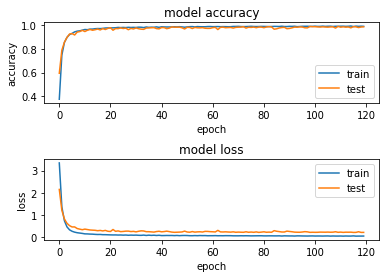

Final Test Accuracy: 0.9880592823028564


In [11]:
# Select the final model based on the max test accuracy across all models

best_model_index = model_accuracy.index(max(model_accuracy))

best_model = models[best_model_index]
best_model_history = model_history[best_model_index]
best_model_train_acc = model_train_acc[best_model_index]
best_model_train_loss = model_train_loss[best_model_index]
best_model_val_acc = model_val_acc[best_model_index]
best_model_val_loss = model_val_loss[best_model_index]

# summarize history for accuracy  
plt.subplot(211)  
plt.plot(best_model_history.history['accuracy'])  
plt.plot(best_model_history.history['val_accuracy'])  
plt.title('model accuracy')  
plt.ylabel('accuracy')  
plt.xlabel('epoch')  
plt.legend(['train', 'test'], loc='lower right')  

# summarize history for loss
plt.subplot(212)  
plt.plot(best_model_history.history['loss'])  
plt.plot(best_model_history.history['val_loss'])  
plt.title('model loss')  
plt.ylabel('loss')  
plt.xlabel('epoch')  
plt.legend(['train', 'test'], loc='upper right')  
plt.subplots_adjust(hspace=0.7)

plt.show() 

print("Final Test Accuracy:", model_accuracy[best_model_index])

In [12]:
#Select only the optimal number of input features for X_test
X_test = X_test[:,:(best_model_index+1)]

# Evaluate the best model on the test data
y_pred = best_model.predict(X_test)

# np.argmax() is used to convert the one-hot encoded predictions and test labels to class labels.
y_pred_label = np.argmax(y_pred, axis = 1)

# Print the classification report
print("Classification report:\n", classification_report(y_test_enc, y_pred_label))


424/424 [==============================] - 1s 1ms/step
Classification report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       591
           1       1.00      1.00      1.00       430
           2       1.00      1.00      1.00       419
           3       1.00      1.00      1.00       384
           4       1.00      1.00      1.00       339
           5       1.00      1.00      1.00       342
           6       1.00      1.00      1.00       310
           7       1.00      1.00      1.00       325
           8       1.00      1.00      1.00       294
           9       1.00      1.00      1.00       269
          10       1.00      1.00      1.00       296
          11       1.00      1.00      1.00       258
          12       1.00      1.00      1.00       247
          13       1.00      1.00      1.00       237
          14       1.00      1.00      1.00       239
          15       1.00      1.00      1.00       235
  

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [13]:
# extract class labels from test data
class_test = y_test_enc

# Invert OsID_labels dictionary
inv_OsID_labels = {v: k for k, v in OsID_labels.items()}

# map OsID values to the class labels
OsID_test = [inv_OsID_labels.get(value, 'Unknown') for value in class_test]

# create dataframe with OsID, true class, predicted class, and true/false columns
results = pd.DataFrame({
    'OsID': OsID_test,
    'True Class': y_test_enc,
    'Predicted Class': y_pred_label,
    'True/False': class_test == y_pred_label
})

# display dataframe
print(results.head())

# save results_df to a CSV file
results.to_csv('MLP_gene classification.csv', index=False)

           OsID  True Class  Predicted Class  True/False
0  Os11g0704500         334              334        True
1  Os09g0279600         161              161        True
2  Os03g0669100          17               17        True
3  Os05g0542500          34               34        True
4  Os09g0522000           7                7        True
